#**Advanced Company Profiling and Validation**

In [349]:
# Installing packages using pip:
!pip install pandas numpy ydata-profiling requests plotly seaborn --quiet

# **Importing Libraries**

In [351]:
import pandas as pd
import numpy as np
import requests
import json
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


# **Data Ingestion**

In [352]:
file_path = "/content/Company.csv"

df_raw = pd.read_csv(file_path)

df_raw.head(10)

,CompanyName,CompanyNumber,RegAddress.CareOf,RegAddress.POBox,RegAddress.AddressLine1,RegAddress.AddressLine2,RegAddress.PostTown,RegAddress.County,RegAddress.Country,RegAddress.PostCode,...,PreviousName_7.CONDATE,PreviousName_7.CompanyName,PreviousName_8.CONDATE,PreviousName_8.CompanyName,PreviousName_9.CONDATE,PreviousName_9.CompanyName,PreviousName_10.CONDATE,PreviousName_10.CompanyName,ConfStmtNextDueDate,ConfStmtLastMadeUpDate
0,BULLDOG MINI SKIPS LTD,15330909,NaN,NaN,"YARD 1, ARNOCK BUNGALOW",SOUTHEND ARTERIAL ROAD,BRENTWOOD,NaN,UNITED KINGDOM,CM13 3TB,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19/12/2024,NaN
1,BULLDOG LIMITED,09043007,NaN,NaN,FORESTERS COTTAGE,STONEY HEATH,BASINGSTOKE,HAMPSHIRE,NaN,RG26 5SW,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30/05/2025,16/05/2024
2,BULLDOG MUSHROOMS LTD,08465312,NaN,NaN,C58-59 NEW COVENT GARDEN MARKET,NINE ELMS LANE,NaN,NaN,NaN,SW8 5JJ,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11/04/2025,28/03/2024
3,BULLDOG MUSICAL ENTERTAINMENTS LIMITED,01652098,NaN,NaN,5 RAVENSFIELD GARDENS,STONELEIGH,SURREY,NaN,NaN,KT19 0ST,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,01/01/2025,18/12/2023
4,BULLDOG NETWORK (BOURNEMOUTH) LIMITED,04667818,NaN,NaN,"FRP ADVISORY TRADING LIMITED, MOUNTBATTEN HOUSE",GROSVENOR SQUARE,SOUTHAMPTON,NaN,NaN,SO15 2RP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,08/02/2022,25/01/2021
5,BULLDOG OFFSHORE SERVICES LIMITED,04357809,NaN,NaN,LAKE HOUSE,LODGE FARM LOKE,LOUND LOWESTOFT,SUFFOLK,NaN,NR32 5LU,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,05/02/2025,22/01/2024
6,BULLDOG OUTDOORS LIMITED,05583758,NaN,NaN,48 UNION STREET,NaN,HYDE,NaN,ENGLAND,SK14 1ND,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19/10/2024,05/10/2023
7,BULLDOG PALLETS & SONS LTD,15431666,NaN,NaN,14 BROOK DENE,WINSLOW,BUCKINGHAM,NaN,ENGLAND,MK18 3FU,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,04/02/2025,NaN
8,BULLDOG PLANT & EQUIPMENT LTD,13302843,NaN,NaN,HOBLONGS INDUSTRIAL ESTATE,CHELMSFORD ROAD,DUNMOW,NaN,ENGLAND,CM6 1JA,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14/04/2025,31/03/2024
9,BULLDOG PLANT LTD,13304901,NaN,NaN,THE FOLLY LOUND ROAD,BLUNDESTON,LOWESTOFT,NaN,ENGLAND,NR32 5AT,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13/04/2025,30/03/2024


#**Data Inspection**

In [353]:
# Shape of the dataset
print(f"Dataset contains {df_raw.shape[0]} rows and {df_raw.shape[1]} columns.")

# Display column names and data types
df_raw.info()

# Check for missing values
print("\nMissing Values (%):")
missing_values = (df_raw.isnull().sum() / len(df_raw)) * 100
print(missing_values[missing_values > 0])

# Summary statistics
df_raw.describe(include='all').T


Dataset contains 307 rows and 55 columns.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307 entries, 0 to 306
Data columns (total 55 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   CompanyName                         307 non-null    object 
 1    CompanyNumber                      306 non-null    object 
 2   RegAddress.CareOf                   2 non-null      object 
 3   RegAddress.POBox                    5 non-null      object 
 4   RegAddress.AddressLine1             307 non-null    object 
 5    RegAddress.AddressLine2            191 non-null    object 
 6   RegAddress.PostTown                 254 non-null    object 
 7   RegAddress.County                   108 non-null    object 
 8   RegAddress.Country                  248 non-null    object 
 9   RegAddress.PostCode                 304 non-null    object 
 10  CompanyCategory                     306 non-null    object 
 11  Com

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CompanyName,307,300,BULLEN INVESTMENTS LIMITED,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CompanyNumber,306,290,13067555,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RegAddress.CareOf,2,2,GW COX & CO,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RegAddress.POBox,5,2,4385,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RegAddress.AddressLine1,307,264,128 CITY ROAD,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RegAddress.AddressLine2,191,156,DRAYTON,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RegAddress.PostTown,254,168,NORWICH,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RegAddress.County,108,48,NORFOLK,14,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RegAddress.Country,248,12,ENGLAND,138,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RegAddress.PostCode,304,242,NR8 6HA,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [354]:
# Check for duplicate records
duplicates = df_raw.duplicated().sum()
print(f"\nTotal duplicate rows: {duplicates}")


Total duplicate rows: 0


In [355]:
# Check for missing values
print("\nMissing Values (%):")
missing_values = (df_raw.isnull().sum())
print(missing_values[missing_values > 0])


Missing Values (%):
 CompanyNumber                          1
RegAddress.CareOf                     305
RegAddress.POBox                      302
 RegAddress.AddressLine2              116
RegAddress.PostTown                    53
RegAddress.County                     199
RegAddress.Country                     59
RegAddress.PostCode                     3
CompanyCategory                         1
CompanyStatus                           1
CountryOfOrigin                         2
DissolutionDate                       305
IncorporationDate                       2
Accounts.AccountRefDay                  6
Accounts.AccountRefMonth                5
Accounts.NextDueDate                    7
Accounts.LastMadeUpDate                85
Accounts.AccountCategory                1
Returns.NextDueDate                     8
Returns.LastMadeUpDate                206
Mortgages.NumMortCharges                2
Mortgages.NumMortOutstanding            2
Mortgages.NumMortPartSatisfied          1
Mortgages.Num

In [356]:
# Value counts for categorical columns (sample)
if 'CompanyCategory' in df_raw.columns:
    print("\nTop 5 Company Categories:")
    print(df_raw['CompanyCategory'].value_counts().head())


Top 5 Company Categories:
CompanyCategory
Private Limited Company                                                  252
Private LTD Company                                                       20
private limited company                                                   12
PRI/LTD BY GUAR/NSC (Private, limited by guarantee, no share capital)      7
Limited Liability Partnership                                              4
Name: count, dtype: int64


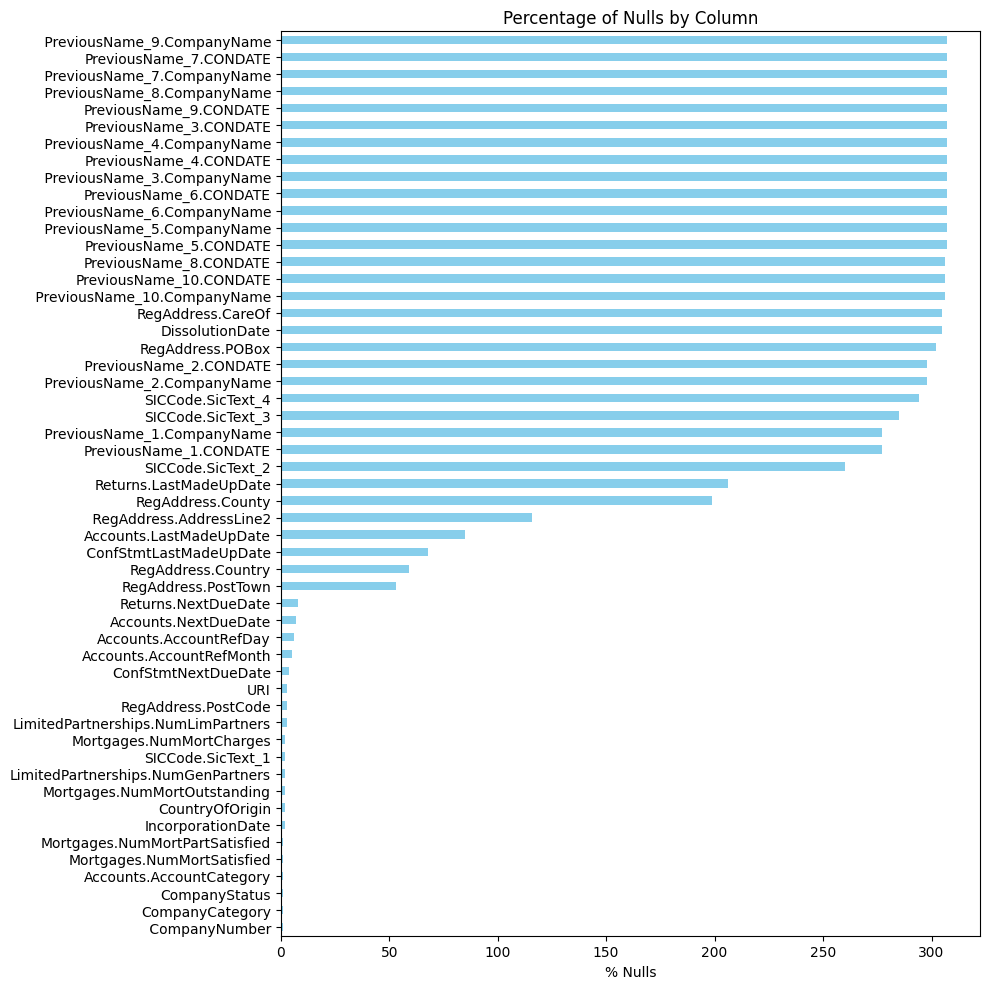

In [357]:
# 📉 Visualizing Null Distribution
plt.figure(figsize=(10, 10))
missing_values[missing_values > 0].sort_values().plot(kind='barh', color='skyblue')
plt.title('Percentage of Nulls by Column')
plt.xlabel('% Nulls')
plt.tight_layout()
plt.show()

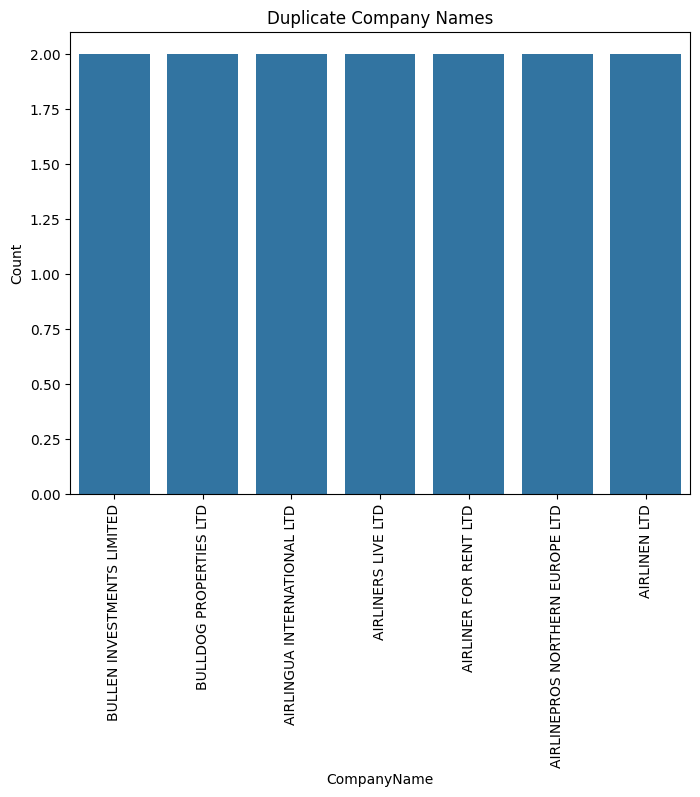

In [358]:
# Count duplicates by company name
duplicate_counts = df_raw['CompanyName'].value_counts()
duplicates_only = duplicate_counts[duplicate_counts > 1]

# Plot duplicate counts
plt.figure(figsize=(8,6))
sns.barplot(x=duplicates_only.index, y=duplicates_only.values)
plt.xticks(rotation=90)
plt.title('Duplicate Company Names')
plt.ylabel('Count')
plt.show()

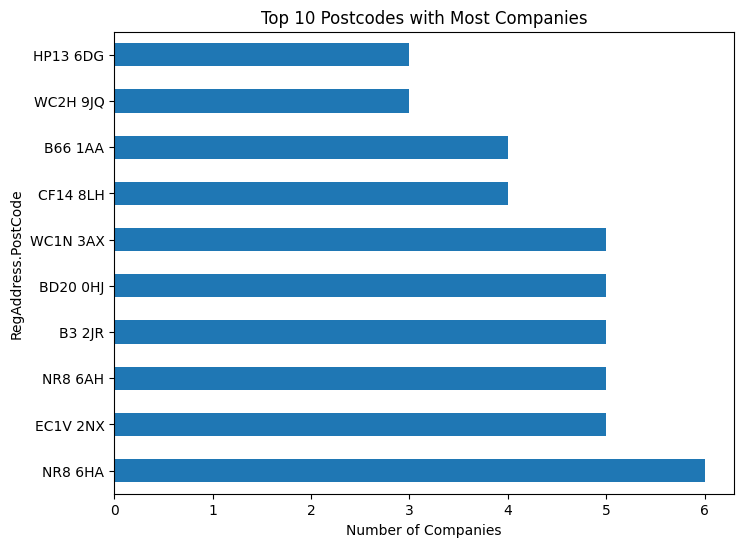

In [359]:
# Top 10 postcodes by count
top_postcodes = df_raw['RegAddress.PostCode'].value_counts().head(10)

top_postcodes.plot(kind='barh', figsize=(8,6))
plt.title('Top 10 Postcodes with Most Companies')
plt.xlabel('Number of Companies')
plt.show()

#**Data Profiling**

In [360]:
# Generating a profile report
profile = ProfileReport(df_raw, title="Company Data Profiling Report", explorative=True)

# Show inline in Jupyter Notebook
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 55/55 [00:01<00:00, 39.33it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [362]:
# Export the report to HTML
profile.to_file("company_profiling_report.html")
print("Profiling report saved as company_profiling_report.html")


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Profiling report saved as company_profiling_report.html


#**Data Cleansing & Validation**

In [363]:
# Create copy of the original
df_clean = df_raw.copy()


In [365]:
# Column names normalization by lowercase, replace spaces with underscores

df_clean.columns = df_clean.columns.str.strip().str.lower().str.replace(' ', '_')

# Display updated column names
print("Normalized Columns:", df_clean.columns.tolist())


Normalized Columns: ['companyname', 'companynumber', 'regaddress.careof', 'regaddress.pobox', 'regaddress.addressline1', 'regaddress.addressline2', 'regaddress.posttown', 'regaddress.county', 'regaddress.country', 'regaddress.postcode', 'companycategory', 'companystatus', 'countryoforigin', 'dissolutiondate', 'incorporationdate', 'accounts.accountrefday', 'accounts.accountrefmonth', 'accounts.nextduedate', 'accounts.lastmadeupdate', 'accounts.accountcategory', 'returns.nextduedate', 'returns.lastmadeupdate', 'mortgages.nummortcharges', 'mortgages.nummortoutstanding', 'mortgages.nummortpartsatisfied', 'mortgages.nummortsatisfied', 'siccode.sictext_1', 'siccode.sictext_2', 'siccode.sictext_3', 'siccode.sictext_4', 'limitedpartnerships.numgenpartners', 'limitedpartnerships.numlimpartners', 'uri', 'previousname_1.condate', 'previousname_1.companyname', 'previousname_2.condate', 'previousname_2.companyname', 'previousname_3.condate', 'previousname_3.companyname', 'previousname_4.condate', '

In [366]:
# Clean CompanyName
df_clean['CompanyName_Clean'] = df_clean['companyname'].str.strip().str.lower().str.replace(r'[^a-z0-9 &]', '', regex=True).str.title()

# Clean CompanyNumber
df_clean['CompanyNumber_Valid'] = df_clean['companynumber'].astype(str).str.strip().str.zfill(8).str.match(r'^[0-9A-Z]{8}$')

# Clean PostCode
df_clean['PostCode_Clean'] = df_clean['regaddress.postcode'].astype(str).str.replace(' ', '').str.upper()

In [367]:
# Define UK postcode regex pattern
postcode_regex = r"^[A-Z]{1,2}\d[A-Z\d]? ?\d[A-Z]{2}$"

# Create a new validation column
df_clean['Postcode_Valid'] = df_clean['regaddress.postcode'].astype(str).str.upper().str.match(postcode_regex)

# Count invalid postcodes
invalid_count = (~df_clean['Postcode_Valid']).sum()
print(f"\nInvalid UK postcodes: {invalid_count}")

# Display invalid postcode rows
invalid_postcodes = df_clean[~df_clean['Postcode_Valid']]
display(invalid_postcodes[['companyname', 'regaddress.postcode']])



Invalid UK postcodes: 4


,companyname,regaddress.postcode
10,BULLDOG PLANTIRE LIMITED,NaN
11,SURREY,31
206,AIRLINE TARIFF PUBLISHING COMPANY,NaN
270,AIRLY INC.,NaN


In [368]:
# Merging columns to derive `FullAddress` column

address_cols = ['regaddress.addressline1', 'regaddress.addressline2', 'regaddress.posttown', 'regaddress.country', 'regaddress.postcode']

# Replace NaN with empty strings
df_clean[address_cols] = df_clean[address_cols].fillna('')

# Concatenate with commas (even if some fields are empty)
df_clean['FullAddress'] = df_clean[address_cols].apply(lambda row: ', '.join([val for val in row if val != '']), axis=1)

# Convert to title case
df_clean['FullAddress'] = df_clean['FullAddress'].str.title()

# Drop original address columns
df_clean.drop(columns=address_cols, inplace=True)

# Preview
print("\nMerged address created. Sample:")
print(df_clean[['FullAddress']].head())



Merged address created. Sample:
                                         FullAddress
0  Yard 1, Arnock Bungalow, Southend Arterial Roa...
1  Foresters Cottage, Stoney Heath, Basingstoke, ...
2  C58-59 New Covent Garden Market, Nine Elms Lan...
3  5 Ravensfield Gardens, Stoneleigh, Surrey, Kt1...
4  Frp Advisory Trading Limited, Mountbatten Hous...


In [370]:
# Clean SIC codes
for i in range(1, 5):
    col = f'siccode.sictext_{i}'
    if col in df_clean.columns:
        df_clean[col] = df_clean[col].str.strip().str.title()

In [371]:
# Convert date columns
date_cols = ['incorporationdate', 'confstmtnextduedate', 'confstmtlastmadeupdate']
date_format = "%d/%m/%Y"
for col in date_cols:
    df_clean[col] = pd.to_datetime(df_clean[col], errors='coerce', format = date_format)

In [372]:
# Fill missing address fields with placeholder for clarity (optional)
for col in ['companynumber', 'confstmtnextduedate', 'confstmtlastmadeupdate']:
    if col in df_clean.columns:
        df_clean[col] = df_clean[col].fillna('unknown')


In [375]:
# Drop rows with missing company name (verifying for any null values in companyname column)

rows_to_drop = df_clean[df_clean[['companyname']].isnull().any(axis=1)]     # Filter the rows

print(f"\nRows that will be dropped (missing company name): {len(rows_to_drop)}")      # Displaying the rows
display(rows_to_drop[['companyname']])

# Now drop the rows
df_clean.dropna(subset=['companyname'], inplace=True)



Rows that will be dropped (missing company name): 0


,companyname


In [377]:
# Dropping unwanted columns

columns_to_drop = ['regaddress.careof', 'regaddress.pobox', 'dissolutiondate', 'previousname_3.condate', 'previousname_3.companyname', 'previousname_4.condate', 'previousname_4.companyname',
                   'previousname_5.condate', 'previousname_5.companyname', 'previousname_6.condate', 'previousname_6.companyname', 'previousname_7.condate', 'previousname_7.companyname',
                   'previousname_8.condate', 'previousname_8.companyname', 'previousname_9.condate', 'previousname_9.companyname', 'previousname_10.condate', 'previousname_10.companyname']

df_cleaned = df_clean.drop(columns=[col for col in columns_to_drop if col in df_clean.columns])

print(f"\nDropped columns: {columns_to_drop}")
print(f"Remaining columns: {df_cleaned.columns.tolist()}")



Dropped columns: ['regaddress.careof', 'regaddress.pobox', 'dissolutiondate', 'previousname_3.condate', 'previousname_3.companyname', 'previousname_4.condate', 'previousname_4.companyname', 'previousname_5.condate', 'previousname_5.companyname', 'previousname_6.condate', 'previousname_6.companyname', 'previousname_7.condate', 'previousname_7.companyname', 'previousname_8.condate', 'previousname_8.companyname', 'previousname_9.condate', 'previousname_9.companyname', 'previousname_10.condate', 'previousname_10.companyname']
Remaining columns: ['companyname', 'companynumber', 'regaddress.county', 'companycategory', 'companystatus', 'countryoforigin', 'incorporationdate', 'accounts.accountrefday', 'accounts.accountrefmonth', 'accounts.nextduedate', 'accounts.lastmadeupdate', 'accounts.accountcategory', 'returns.nextduedate', 'returns.lastmadeupdate', 'mortgages.nummortcharges', 'mortgages.nummortoutstanding', 'mortgages.nummortpartsatisfied', 'mortgages.nummortsatisfied', 'siccode.sictext

) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


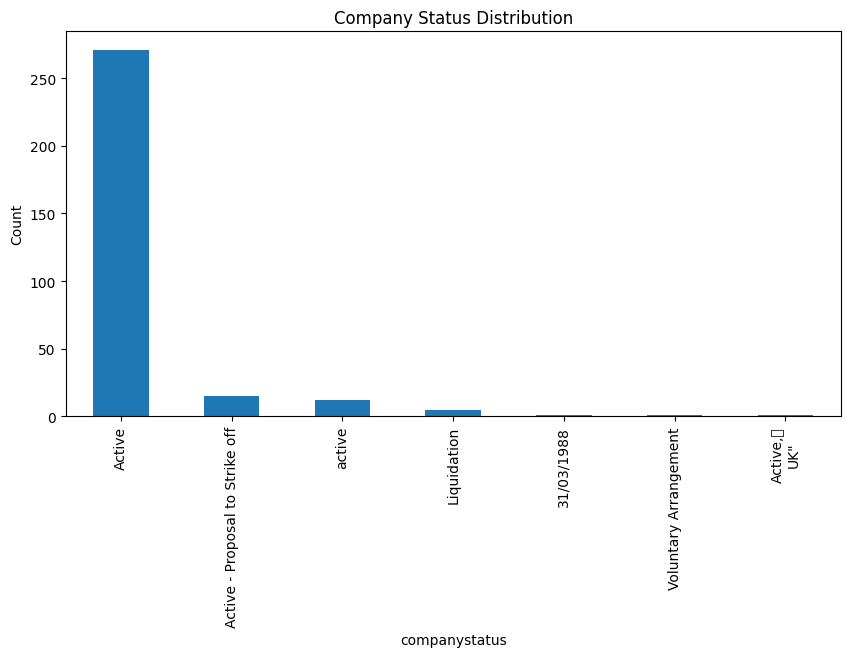

In [392]:
# Plot company status counts
df_cleaned['companystatus'].value_counts().plot(kind='bar', figsize=(10,5))
plt.title('Company Status Distribution')
plt.ylabel('Count')
plt.show()

#**Data Deduplicatinon**

In [393]:
# Creating a flag column for duplicates (True/False)
df_cleaned['is_duplicate'] = df_cleaned.duplicated(subset=['companyname', 'companynumber'], keep=False)

# Counting no. of duplicates flagged
print(f"\nTotal duplicate rows flagged: {df_cleaned['is_duplicate'].sum()}")

# view only the duplicate rows
duplicates_flagged = df_cleaned[df_cleaned['is_duplicate']]
display(duplicates_flagged[['companyname', 'companynumber', 'is_duplicate']])



Total duplicate rows flagged: 4


,companyname,companynumber,is_duplicate
214,AIRLINEN LTD,10141677,True
229,AIRLINGUA INTERNATIONAL LTD,09084985,True
287,AIRLINEN LTD,10141677,True
302,AIRLINGUA INTERNATIONAL LTD,09084985,True


In [394]:
# Duplicates by companyname
duplicates_name = df_cleaned[df_cleaned.duplicated(subset=['companyname'], keep=False)]
print(f"\nDuplicate rows by companyname: {len(duplicates_name)}")
display(duplicates_name[['companyname', 'companynumber']])

# Duplicates by companynumber
duplicates_number = df_cleaned[df_cleaned.duplicated(subset=['companynumber'], keep=False)]
print(f"\nDuplicate rows by companynumber: {len(duplicates_number)}")
display(duplicates_number[['companyname', 'companynumber']])



Duplicate rows by companyname: 14


,companyname,companynumber
24,BULLDOG PROPERTIES LTD,13732085
25,BULLDOG PROPERTIES LTD,12787961
114,BULLEN INVESTMENTS LIMITED,01845966
115,BULLEN INVESTMENTS LIMITED,OE028123
214,AIRLINEN LTD,10141677
216,AIRLINEPROS NORTHERN EUROPE LTD,12079551
217,AIRLINER FOR RENT LTD,11157621
219,AIRLINERS LIVE LTD,14062002
229,AIRLINGUA INTERNATIONAL LTD,09084985
287,AIRLINEN LTD,10141677



Duplicate rows by companynumber: 32


,companyname,companynumber
51,BULLDOG SKINCARE LIMITED,05717974
52,BULLDOG SOLUTIONS GRP LTD,13067555
53,BULLDOG SKINCARE,05717974
54,BULLDOG SOLUTIONS GRP,13067555
212,AIRLINE TRAVELS LIMITED,08403564
213,AIRLINE VENTURES LIMITED,11044404
214,AIRLINEN LTD,10141677
215,AIRLINEPREP LIMITED,10399598
218,AIRLINER1 EUROPE LIMITED,SC464056
221,AIRLINES BAGAGE LTD,15139570


In [395]:
# Flag duplicates by companyname
df_cleaned['is_duplicate_name'] = df_cleaned.duplicated(subset=['companyname'], keep=False)

# Flag duplicates by companynumber
df_cleaned['is_duplicate_number'] = df_cleaned.duplicated(subset=['companynumber'], keep=False)

# View counts
print(f"\nDuplicate rows by companyname: {df_cleaned['is_duplicate_name'].sum()}")
print(f"Duplicate rows by companynumber: {df_cleaned['is_duplicate_number'].sum()}")



Duplicate rows by companyname: 14
Duplicate rows by companynumber: 32


<ipython-input-396-eef9a2d1c8d2>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(duplicate_counts.keys()), y=list(duplicate_counts.values()), palette='Blues_d')


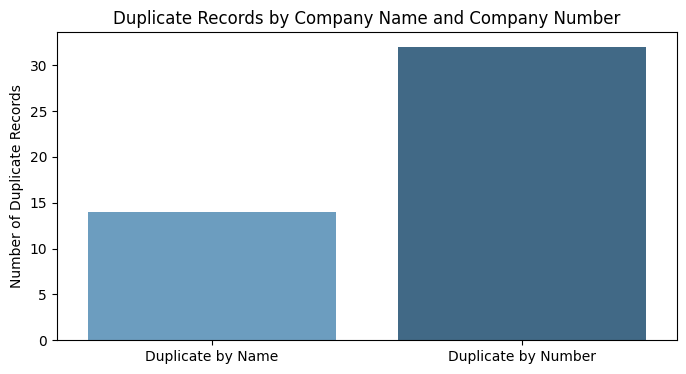

In [396]:
import matplotlib.pyplot as plt
import seaborn as sns

# Bar chart comparing duplicate counts
duplicate_counts = {
    'Duplicate by Name': df_cleaned['is_duplicate_name'].sum(),
    'Duplicate by Number': df_cleaned['is_duplicate_number'].sum()
}

plt.figure(figsize=(8,4))
sns.barplot(x=list(duplicate_counts.keys()), y=list(duplicate_counts.values()), palette='Blues_d')
plt.ylabel('Number of Duplicate Records')
plt.title('Duplicate Records by Company Name and Company Number')
plt.show()

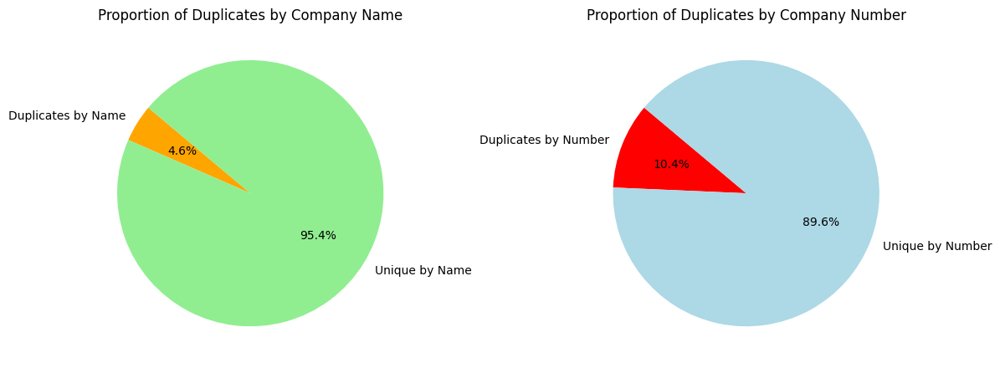

In [397]:
# Counts for duplicates
duplicates_name_count = df_cleaned['is_duplicate_name'].sum()
non_duplicates_name_count = len(df_cleaned) - duplicates_name_count

duplicates_number_count = df_cleaned['is_duplicate_number'].sum()
non_duplicates_number_count = len(df_cleaned) - duplicates_number_count

# Create a figure with 1 row and 2 columns of subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Pie chart for duplicate by name
ax1.pie([duplicates_name_count, non_duplicates_name_count],
        labels=['Duplicates by Name', 'Unique by Name'],
        autopct='%1.1f%%', startangle=140, colors=['orange', 'lightgreen'])
ax1.set_title('Proportion of Duplicates by Company Name')

# Pie chart for duplicate by number
ax2.pie([duplicates_number_count, non_duplicates_number_count],
        labels=['Duplicates by Number', 'Unique by Number'],
        autopct='%1.1f%%', startangle=140, colors=['red', 'lightblue'])
ax2.set_title('Proportion of Duplicates by Company Number')

plt.tight_layout()

# Show both plots together
plt.show()


#**Data Matching and Enrichment**

In [387]:
import requests
import time

API_KEY = "dde9fe18-7dc6-454e-9897-b2f5f5a8c9f8"

BASE_URL = "https://api.company-information.service.gov.uk/search/companies"


In [389]:
# Create function to get the company data calling REST API
def search_company(name):
    try:
        response = requests.get(BASE_URL, params={'q': name}, auth=(API_KEY, ''))
        if response.status_code == 200:
            data = response.json()
            if data['items']:
                return data['items'][0]
            else:
                return None
        else:
            print(f"API error for {name}: {response.status_code}")
            return None
    except Exception as e:
        print(f"Exception for {name}: {e}")
        return None

In [390]:
# Data Enrichment by adding new columns from API

enrichment_results = []
for idx, row in df_cleaned.iterrows():
    company_data = search_company(row['companyname'])
    if company_data:
        enrichment_results.append({
            'companyname': row['companyname'],
            'MatchedName': company_data.get('title'),
            'CompanyNumber_API': company_data.get('company_number'),
            'CompanyStatus_API': company_data.get('company_status'),
            'IncorporationDate_API': company_data.get('date_of_creation'),
            'CompanyAddress_API': company_data.get('address_snippet')
        })
    else:
        enrichment_results.append({
            'companyname': row['companyname'],
            'MatchedName': None,
            'CompanyNumber_API': None,
            'CompanyStatus_API': None,
            'IncorporationDate_API': None,
            'CompanyAddress_API': None
        })
    time.sleep(1)

In [391]:
# Convert to DataFrame
enrichment_df = pd.DataFrame(enrichment_results)
enrichment_df

,companyname,MatchedName,CompanyNumber_API,CompanyStatus_API,IncorporationDate_API,CompanyAddress_API
0,BULLDOG MINI SKIPS LTD,BULLDOG MINI SKIPS LTD,15330909,active,2023-12-06,"Yard 1, Arnock Bungalow, Southend Arterial Roa..."
1,BULLDOG LIMITED,BULLDOG LTD,01954910,active,1985-11-05,"8 Church Green East, Redditch, Worcestershire,..."
2,BULLDOG MUSHROOMS LTD,BULLDOG MUSHROOMS LTD,08465312,active,2013-03-28,"C58-59 New Covent Garden Market, Nine Elms Lan..."
3,BULLDOG MUSICAL ENTERTAINMENTS LIMITED,BULLDOG MUSICAL ENTERTAINMENTS LIMITED,01652098,active,1982-07-16,"5 Ravensfield Gardens, Stoneleigh, Surrey, KT1..."
4,BULLDOG NETWORK (BOURNEMOUTH) LIMITED,BULLDOG NETWORK (BOURNEMOUTH) LIMITED,04667818,dissolved,2003-02-17,"Frp Advisory Trading Limited, Mountbatten Hous..."
...,...,...,...,...,...,...
302,AIRLINGUA INTERNATIONAL LTD,AIRLINGUA INTERNATIONAL LTD,09084985,active,2014-06-13,"258b High Street, Dorking, Surrey, England, RH..."
303,AIRLINKS 4 U LTD,AIRLINKS PRIVATE LTD,15247595,dissolved,2023-10-30,"299 Sheppey Road, Dagenham, United Kingdom, RM..."
304,AIRLINKS COMMUNICATION LTD,AIRLINKS PRIVATE LTD,15247595,dissolved,2023-10-30,"299 Sheppey Road, Dagenham, United Kingdom, RM..."
305,AIRLINKS GLOBAL TRAVEL LTD,AIRLINKS PRIVATE LTD,15247595,dissolved,2023-10-30,"299 Sheppey Road, Dagenham, United Kingdom, RM..."


In [398]:
# Merge enrichment back to cleaned dataframe
df_final = df_cleaned.merge(enrichment_df, on='companyname', how='left')

In [414]:
df_final.head()

,companyname,companynumber,regaddress.county,companycategory,companystatus,countryoforigin,incorporationdate,accounts.accountrefday,accounts.accountrefmonth,accounts.nextduedate,...,Postcode_Valid,FullAddress,is_duplicate,is_duplicate_name,is_duplicate_number,MatchedName,CompanyNumber_API,CompanyStatus_API,IncorporationDate_API,CompanyAddress_API
0,BULLDOG MINI SKIPS LTD,15330909,NaN,Private Limited Company,Active,United Kingdom,2023-12-06,31.0,12,06/09/2025,...,True,"Yard 1, Arnock Bungalow, Southend Arterial Roa...",False,False,False,BULLDOG MINI SKIPS LTD,15330909,active,2023-12-06,"Yard 1, Arnock Bungalow, Southend Arterial Roa..."
1,BULLDOG LIMITED,09043007,HAMPSHIRE,Private Limited Company,Active,United Kingdom,2014-05-16,31.0,3,31/12/2024,...,True,"Foresters Cottage, Stoney Heath, Basingstoke, ...",False,False,False,BULLDOG LTD,01954910,active,1985-11-05,"8 Church Green East, Redditch, Worcestershire,..."
2,BULLDOG MUSHROOMS LTD,08465312,NaN,Private Limited Company,Active,United Kingdom,2013-03-28,29.0,4,29/01/2025,...,True,"C58-59 New Covent Garden Market, Nine Elms Lan...",False,False,False,BULLDOG MUSHROOMS LTD,08465312,active,2013-03-28,"C58-59 New Covent Garden Market, Nine Elms Lan..."
3,BULLDOG MUSICAL ENTERTAINMENTS LIMITED,01652098,NaN,Private Limited Company,Active,United Kingdom,1982-07-16,31.0,3,31/12/2024,...,True,"5 Ravensfield Gardens, Stoneleigh, Surrey, Kt1...",False,False,False,BULLDOG MUSICAL ENTERTAINMENTS LIMITED,01652098,active,1982-07-16,"5 Ravensfield Gardens, Stoneleigh, Surrey, KT1..."
4,BULLDOG NETWORK (BOURNEMOUTH) LIMITED,04667818,NaN,Private Limited Company,Liquidation,United Kingdom,2003-02-17,31.0,3,31/12/2021,...,True,"Frp Advisory Trading Limited, Mountbatten Hous...",False,False,False,BULLDOG NETWORK (BOURNEMOUTH) LIMITED,04667818,dissolved,2003-02-17,"Frp Advisory Trading Limited, Mountbatten Hous..."


#**Validate matches & investigate discrepancies**

In [400]:
# Check unmatched companies
unmatched = df_final[df_final['MatchedName'].isnull()]
print(f"\nUnmatched companies: {len(unmatched)}")
display(unmatched[['companyname']])

# Check name discrepancies
name_mismatch = df_final[df_final['companyname'].str.lower() != df_final['MatchedName'].str.lower()]
print(f"\nName mismatches: {len(name_mismatch)}")
display(name_mismatch[['companyname', 'MatchedName']])



Unmatched companies: 1


,companyname
314,AIRLINEOLUTIONS LTD



Name mismatches: 34


,companyname,MatchedName
1,BULLDOG LIMITED,BULLDOG LTD
11,SURREY,SURREY LTD
28,BULLDOG PROPERTY INVESTMENTS,BULLDOG PROPERTY INVESTMENTS LTD
29,BULLDOG PROPERTY SERVICES,BULLDOG PROPERTY SERVICES LTD
30,BULLDOG PROPERTY SOURCES LTD,PHOENIX PROPERTY SOURCES LIMITED
38,BULLDOG RESCUE AND RE-HOMING TRUST,BULLDOG RESCUE AND RE-HOMING TRUST
55,BULLDOG SKINCARE,BULLDOG SKINCARE LIMITED
56,BULLDOG SOLUTIONS GRP,BULLDOG SOLUTIONS GRP LTD
80,BULLDOGAGENCY. LTD,STRATEGIC MARKETING PARTNERS LTD
110,BULLEN GROUP LIMITED,BULLEN DEVELOPMENTS LIMITED


In [403]:
validation_summary = pd.DataFrame({
    'Metric': ['Invalid Company Numbers', 'Invalid Postcodes', 'Duplicate Records'],
    'Count': [df_cleaned['CompanyNumber_Valid'].value_counts().get(False,0),
              invalid_postcodes.shape[0],
              df_cleaned['is_duplicate'].sum()]
})

validation_summary['Percentage'] = (validation_summary['Count'] / len(df_cleaned) * 100).round(2)

display(validation_summary)


,Metric,Count,Percentage
0,Invalid Company Numbers,1,0.33
1,Invalid Postcodes,4,1.30
2,Duplicate Records,4,1.30


In [410]:
columns = ['CompanyName_Clean', 'companynumber', 'companystatus', 'incorporationdate', 'FullAddress', 'MatchedName', 'CompanyNumber_API', 'CompanyStatus_API', 'IncorporationDate_API', 'CompanyAddress_API']
df_final[columns].head(20)


,CompanyName_Clean,companynumber,companystatus,incorporationdate,FullAddress,MatchedName,CompanyNumber_API,CompanyStatus_API,IncorporationDate_API,CompanyAddress_API
0,Bulldog Mini Skips Ltd,15330909,Active,2023-12-06,"Yard 1, Arnock Bungalow, Southend Arterial Roa...",BULLDOG MINI SKIPS LTD,15330909,active,2023-12-06,"Yard 1, Arnock Bungalow, Southend Arterial Roa..."
1,Bulldog Limited,09043007,Active,2014-05-16,"Foresters Cottage, Stoney Heath, Basingstoke, ...",BULLDOG LTD,01954910,active,1985-11-05,"8 Church Green East, Redditch, Worcestershire,..."
2,Bulldog Mushrooms Ltd,08465312,Active,2013-03-28,"C58-59 New Covent Garden Market, Nine Elms Lan...",BULLDOG MUSHROOMS LTD,08465312,active,2013-03-28,"C58-59 New Covent Garden Market, Nine Elms Lan..."
3,Bulldog Musical Entertainments Limited,01652098,Active,1982-07-16,"5 Ravensfield Gardens, Stoneleigh, Surrey, Kt1...",BULLDOG MUSICAL ENTERTAINMENTS LIMITED,01652098,active,1982-07-16,"5 Ravensfield Gardens, Stoneleigh, Surrey, KT1..."
4,Bulldog Network Bournemouth Limited,04667818,Liquidation,2003-02-17,"Frp Advisory Trading Limited, Mountbatten Hous...",BULLDOG NETWORK (BOURNEMOUTH) LIMITED,04667818,dissolved,2003-02-17,"Frp Advisory Trading Limited, Mountbatten Hous..."
5,Bulldog Offshore Services Limited,04357809,Active,2002-01-22,"Lake House, Lodge Farm Loke, Lound Lowestoft, ...",BULLDOG OFFSHORE SERVICES LIMITED,04357809,active,2002-01-22,"Lake House, Lodge Farm Loke, Lound Lowestoft, ..."
6,Bulldog Outdoors Limited,05583758,Active,2005-10-05,"48 Union Street, Hyde, England, Sk14 1Nd",BULLDOG OUTDOORS LIMITED,05583758,active,2005-10-05,"48 Union Street, Hyde, England, SK14 1ND"
7,Bulldog Pallets & Sons Ltd,15431666,Active,2024-01-22,"14 Brook Dene, Winslow, Buckingham, England, M...",BULLDOG PALLETS & SONS LTD,15431666,active,2024-01-22,"14 Brook Dene, Winslow, Buckingham, England, M..."
8,Bulldog Plant & Equipment Ltd,13302843,Active,2021-03-30,"Hoblongs Industrial Estate, Chelmsford Road, D...",BULLDOG PLANT & EQUIPMENT LTD,13302843,active,2021-03-30,"Hoblongs Industrial Estate, Chelmsford Road, D..."
9,Bulldog Plant Ltd,13304901,Active,2021-03-31,"The Folly Lound Road, Blundeston, Lowestoft, E...",BULLDOG PLANT LTD,13304901,active,2021-03-31,"The Folly Lound Road, Blundeston, Lowestoft, E..."


#**Reporting & Visualization**


--- Final Summary ---
Total records: 321
Matched records: 320


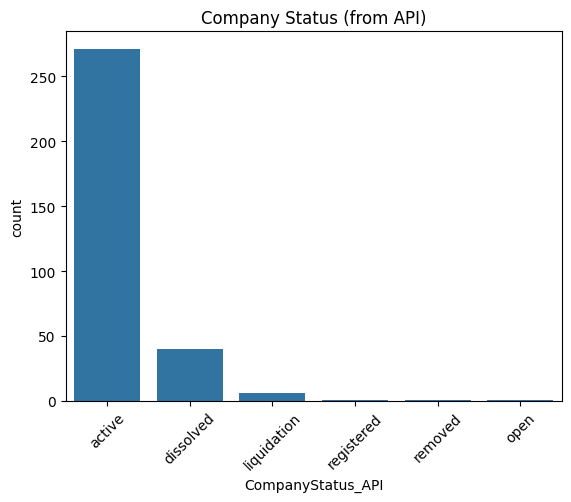

In [409]:
print("\n--- Final Summary ---")
print(f"Total records: {len(df_final)}")
print(f"Matched records: {df_final['MatchedName'].notnull().sum()}")

sns.countplot(data=df_final, x='CompanyStatus_API')
plt.title("Company Status (from API)")
plt.xticks(rotation=45)
plt.show()


In [411]:
# Exported cleaned & enriched data

df_final.to_csv('Cleaned_Enriched_Companies.csv', index=False)
print("\n✅ Cleaned & enriched dataset saved to 'Cleaned_Enriched_Companies.csv'")


✅ Cleaned & enriched dataset saved to 'Cleaned_Enriched_Companies.csv'
